In [94]:
using Statistics
using Plots, Plots.PlotMeasures
using CSV
using DataFrames
using LaTeXStrings
using Formatting
using ColorSchemes

# One neuron

In [103]:
df_angle_one = CSV.read("angle_one_neuron_sim.csv", DataFrame);
df_voltage_one = CSV.read("voltage_one_neuron_sim.csv", DataFrame);
df_feed_one = CSV.read("feed_one_neuron_sim.csv", DataFrame);

[ Info: Saved animation to c:\Users\chris\OneDrive\Documents\Unif\2022-2023\TFE\ATFE0014_TFE\Presentation\Animations\single_neuron.gif


Plots.AnimatedGif("c:\\Users\\chris\\OneDrive\\Documents\\Unif\\2022-2023\\TFE\\ATFE0014_TFE\\Presentation\\Animations\\single_neuron.gif")
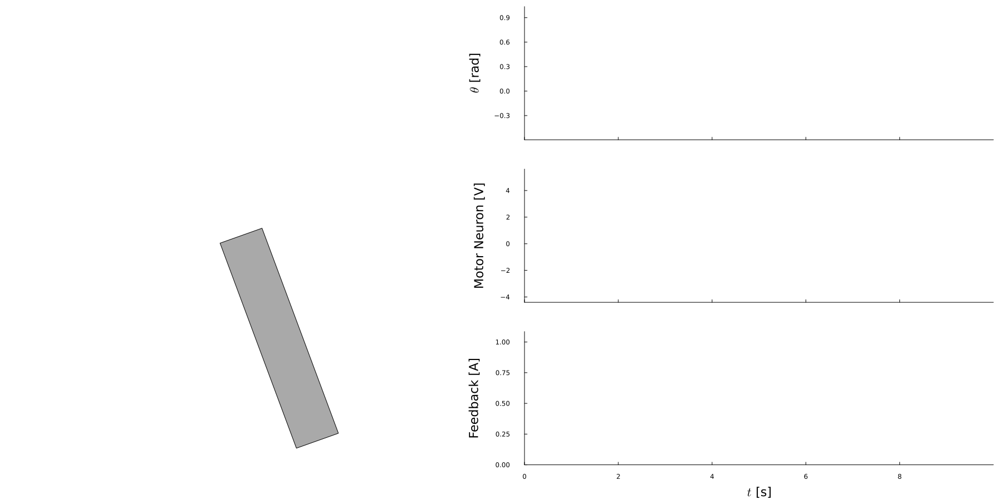

In [104]:
gr(legendfontsize=13,labelfontsize=15)
time = df_angle_one[!, "time"]
angle = df_angle_one[!, "1"]
voltage = df_voltage_one[!, "1"]
feed = df_feed_one[!, "2"]

last_ind = size(time)[1]÷5
t_final = time[last_ind]

max_angle = maximum(angle)
min_angle = minimum(angle)

max_feed = maximum(feed)
min_feed = minimum(feed)

max_voltage = maximum(voltage)
min_voltage = -4

length = 10
radius = 1

anim = @animate for i = 1:20:last_ind
    l = @layout [
        a{0.5w} Plots.grid(3,1)
    ]
    curr_angle = angle[i]
    s_a = sin(curr_angle)
    c_a = cos(curr_angle)
    radius_cos = radius*c_a
    radius_sin = radius*s_a
    length_cos = length*c_a
    length_sin = length*s_a 

    pendulum = Shape([radius_cos, length_sin + radius_cos, length_sin - radius_cos, -radius_cos, radius_cos], [radius_sin, -length_cos + radius_sin, -length_cos - radius_sin, -radius_sin, radius_sin])
    p1 = plot(pendulum, c=:darkgray, xlims=(-1.05*length,1.05*length) ,ylims=(-1.05*length,1.05*length), legend=false, axis=([], false), grid=false)
    p2 = plot(time[1:i], angle[1:i], grid=false, lw=0.5, lc=:blue, xformatter=Returns(""),

              xlims=(0,t_final) ,ylims=(1.1*min_angle, max_angle*1.1), ylabel=latexstring("\$\\theta\$ [rad]"), legend=false)
    p3 = plot(time[1:i], voltage[1:i], grid=false, lw=0.5, lc=:blue, xformatter=Returns(""),
              xlims=(0,t_final) ,ylims=(1.1*min_voltage, max_voltage*1.1), ylabel="Motor Neuron [V]", legend=false)
    p4 = plot(time[1:i], feed[1:i], grid=false, lw=0.5, lc=:blue,
              xlims=(0,t_final) ,ylims=(1.1*min_feed, max_feed*1.1), ylabel="Feedback [A]", xlabel=latexstring("\$t\$ [s]"), legend=false)
    plot(p1, p2, p3, p4, size=(1800,900), bottommargin=20px, layout=l)
end

gif(anim, "single_neuron.gif", fps = 50)

In [105]:
df_angle_one_poor = CSV.read("angle_one_neuron_poor_sim.csv", DataFrame);
df_voltage_one_poor = CSV.read("voltage_one_neuron_poor_sim.csv", DataFrame);
df_feed_one_poor = CSV.read("feed_one_neuron_poor_sim.csv", DataFrame);

[ Info: Saved animation to c:\Users\chris\OneDrive\Documents\Unif\2022-2023\TFE\ATFE0014_TFE\Presentation\Animations\single_neuron_poor.gif


Plots.AnimatedGif("c:\\Users\\chris\\OneDrive\\Documents\\Unif\\2022-2023\\TFE\\ATFE0014_TFE\\Presentation\\Animations\\single_neuron_poor.gif")
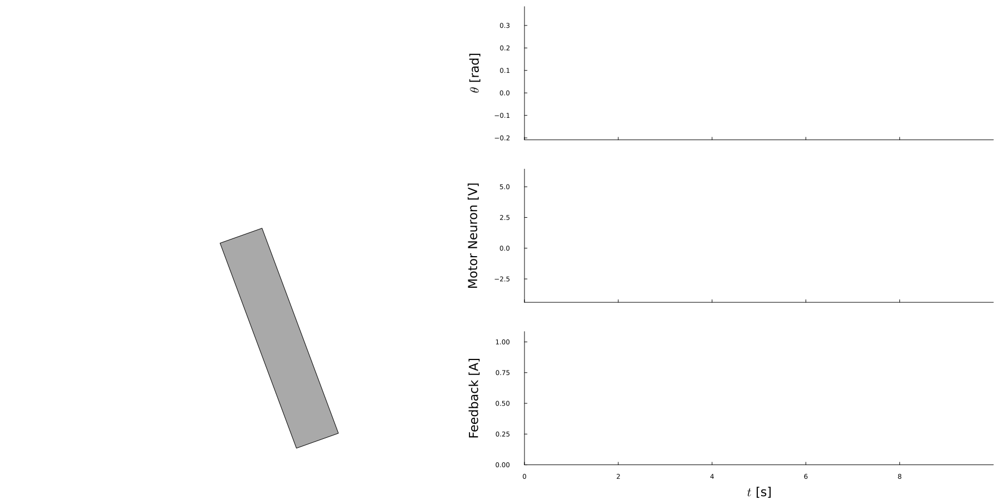

In [106]:
gr(legendfontsize=13,labelfontsize=15)
time = df_angle_one_poor[!, "time"]
angle = df_angle_one_poor[!, "1"]
voltage = df_voltage_one_poor[!, "1"]
feed = df_feed_one_poor[!, "2"]

last_ind = 2*size(time)[1]÷5
t_final = time[last_ind]

max_angle = maximum(angle)
min_angle = minimum(angle)

max_feed = maximum(feed)
min_feed = minimum(feed)

max_voltage = maximum(voltage)
min_voltage = -4

length = 10
radius = 1

anim = @animate for i = 1:20:last_ind
    l = @layout [
        a{0.5w} Plots.grid(3,1)
    ]
    curr_angle = angle[i]
    s_a = sin(curr_angle)
    c_a = cos(curr_angle)
    radius_cos = radius*c_a
    radius_sin = radius*s_a
    length_cos = length*c_a
    length_sin = length*s_a 

    pendulum = Shape([radius_cos, length_sin + radius_cos, length_sin - radius_cos, -radius_cos, radius_cos], [radius_sin, -length_cos + radius_sin, -length_cos - radius_sin, -radius_sin, radius_sin])
    p1 = plot(pendulum, c=:darkgray, xlims=(-1.05*length,1.05*length) ,ylims=(-1.05*length,1.05*length), legend=false, axis=([], false), grid=false)
    
    p2 = plot(time[1:i], angle[1:i], grid=false, lw=0.5, lc=:blue, xformatter=Returns(""),
              xlims=(0,t_final) ,ylims=(1.1*min_angle, max_angle*1.1), ylabel=latexstring("\$\\theta\$ [rad]"), legend=false)

    p3 = plot(time[1:i], voltage[1:i], grid=false, lw=0.5, lc=:blue, xformatter=Returns(""),
              xlims=(0,t_final) ,ylims=(1.1*min_voltage, max_voltage*1.1), ylabel="Motor Neuron [V]", legend=false)

    p4 = plot(time[1:i], feed[1:i], grid=false, lw=0.5, lc=:blue,
              xlims=(0,t_final) ,ylims=(1.1*min_feed, max_feed*1.1), ylabel="Feedback [A]", xlabel=latexstring("\$t\$ [s]"), legend=false)

    plot(p1, p2, p3, p4, size=(1800,900), bottommargin=20px, layout=l)
end

gif(anim, "single_neuron_poor.gif", fps = 50)

In [107]:
df_angle_one_neur_poor = CSV.read("angle_one_neuron_neurfeed_poor_sim.csv", DataFrame);
df_voltage_one_neur_poor = CSV.read("voltage_one_neuron_neurfeed_poor_sim.csv", DataFrame);
df_feed_one_neur_poor = CSV.read("feed_one_neuron_neurfeed_poor_sim.csv", DataFrame);

[ Info: Saved animation to c:\Users\chris\OneDrive\Documents\Unif\2022-2023\TFE\ATFE0014_TFE\Presentation\Animations\single_neuron_neurfeed_poor.gif


Plots.AnimatedGif("c:\\Users\\chris\\OneDrive\\Documents\\Unif\\2022-2023\\TFE\\ATFE0014_TFE\\Presentation\\Animations\\single_neuron_neurfeed_poor.gif")
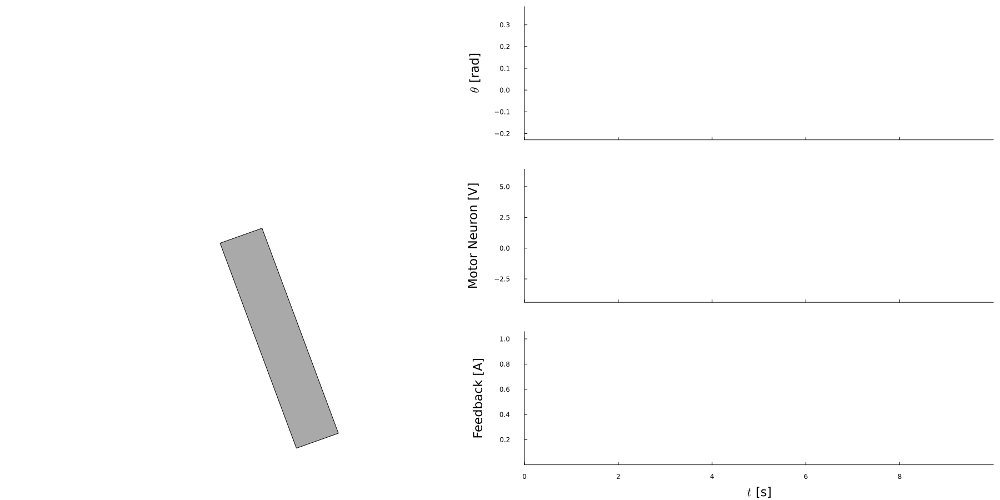

In [108]:
gr(legendfontsize=13,labelfontsize=15)
time = df_angle_one_neur_poor[!, "time"]
angle = df_angle_one_neur_poor[!, "1"]
voltage = df_voltage_one_neur_poor[!, "1"]
feed = df_feed_one_neur_poor[!, "1"]

last_ind = 2*size(time)[1]÷5
t_final = time[last_ind]

max_angle = maximum(angle)
min_angle = minimum(angle)

max_feed = maximum(feed)
min_feed = minimum(feed)

max_voltage = maximum(voltage)
min_voltage = -4

length = 10
radius = 1

anim = @animate for i = 1:20:last_ind
    l = @layout [
        a{0.5w} Plots.grid(3,1)
    ]
    curr_angle = angle[i]
    s_a = sin(curr_angle)
    c_a = cos(curr_angle)
    radius_cos = radius*c_a
    radius_sin = radius*s_a
    length_cos = length*c_a
    length_sin = length*s_a 

    pendulum = Shape([radius_cos, length_sin + radius_cos, length_sin - radius_cos, -radius_cos, radius_cos], [radius_sin, -length_cos + radius_sin, -length_cos - radius_sin, -radius_sin, radius_sin])
    p1 = plot(pendulum, c=:darkgray, xlims=(-1.05*length,1.05*length) ,ylims=(-1.05*length,1.05*length), legend=false, axis=([], false), grid=false)

    p2 = plot(time[1:i], angle[1:i], grid=false, lw=0.5, lc=:blue, xformatter=Returns(""),
              xlims=(0,t_final) ,ylims=(1.1*min_angle, max_angle*1.1), ylabel=latexstring("\$\\theta\$ [rad]"), legend=false)

    p3 = plot(time[1:i], voltage[1:i], grid=false, lw=0.5, lc=:blue, xformatter=Returns(""),
              xlims=(0,t_final) ,ylims=(1.1*min_voltage, max_voltage*1.1), ylabel="Motor Neuron [V]", legend=false)

    p4 = plot(time[1:i], feed[1:i], grid=false, lw=0.5, lc=:blue,
              xlims=(0,t_final) ,ylims=(1.1*min_feed, max_feed*1.1), ylabel="Feedback [A]", xlabel=latexstring("\$t\$ [s]"), legend=false)

    plot(p1, p2, p3, p4, size=(1800,900), bottommargin=20px, layout=l)
end

gif(anim, "single_neuron_neurfeed_poor.gif", fps = 50)

# Two Neurons

In [109]:
df_angle_two = CSV.read("angle_two_neuron_sim.csv", DataFrame);
df_voltage_two = CSV.read("voltage_two_neuron_sim.csv", DataFrame);
df_feed_two = CSV.read("feed_two_neuron_sim.csv", DataFrame);

[ Info: Saved animation to c:\Users\chris\OneDrive\Documents\Unif\2022-2023\TFE\ATFE0014_TFE\Presentation\Animations\double_neuron.gif


Plots.AnimatedGif("c:\\Users\\chris\\OneDrive\\Documents\\Unif\\2022-2023\\TFE\\ATFE0014_TFE\\Presentation\\Animations\\double_neuron.gif")
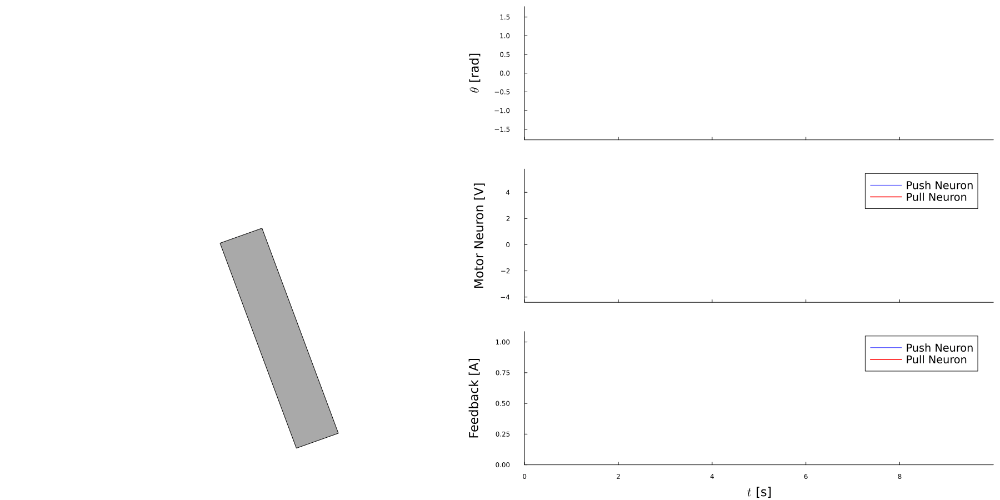

In [110]:
gr(legendfontsize=13,labelfontsize=15)
time = df_angle_two[!, "time"]
angle = df_angle_two[!, "1"]
voltage1 = df_voltage_two[!, "1"]
voltage2 = df_voltage_two[!, "2"]
feed1 = df_feed_two[!, "1"]
feed2 = df_feed_two[!, "2"]

last_ind = size(time)[1]÷5
t_final = time[last_ind]

max_angle = maximum(angle)
min_angle = minimum(angle)

max_feed = max(maximum(feed1), maximum(feed2))
min_feed = min(minimum(feed1), minimum(feed2))

max_voltage = max(maximum(voltage1), maximum(voltage2))
min_voltage = -4

length = 10
radius = 1

anim = @animate for i = 1:20:last_ind
    l = @layout [
        a{0.5w} Plots.grid(3,1)
    ]
    curr_angle = angle[i]
    s_a = sin(curr_angle)
    c_a = cos(curr_angle)
    radius_cos = radius*c_a
    radius_sin = radius*s_a
    length_cos = length*c_a
    length_sin = length*s_a 

    pendulum = Shape([radius_cos, length_sin + radius_cos, length_sin - radius_cos, -radius_cos, radius_cos], [radius_sin, -length_cos + radius_sin, -length_cos - radius_sin, -radius_sin, radius_sin])
    p1 = plot(pendulum, c=:darkgray, xlims=(-1.05*length,1.05*length) ,ylims=(-1.05*length,1.05*length), legend=false, axis=([], false), grid=false)

    p2 = plot(time[1:i], angle[1:i], grid=false, lw=0.5, lc=:blue, xformatter=Returns(""),
              xlims=(0,t_final) ,ylims=(1.1*min_angle, max_angle*1.1), ylabel=latexstring("\$\\theta\$ [rad]"), legend=false)

    p3 = plot(time[1:i], voltage1[1:i], grid=false, lw=0.5, lc=:blue, xformatter=Returns(""),
              xlims=(0,t_final) ,ylims=(1.1*min_voltage, max_voltage*1.1), ylabel="Motor Neuron [V]", label="Push Neuron")
    plot!(time[1:i], voltage2[1:i], lc=:red, label="Pull Neuron")

    p4 = plot(time[1:i], feed1[1:i], grid=false, lw=0.5, lc=:blue,
              xlims=(0,t_final) ,ylims=(1.1*min_feed, max_feed*1.1), ylabel="Feedback [A]", xlabel=latexstring("\$t\$ [s]"), label="Push Neuron")
    plot!(time[1:i], feed2[1:i], lc=:red, label="Pull Neuron")
    
    plot(p1, p2, p3, p4, size=(1800,900), bottommargin=20px, layout=l)
end

gif(anim, "double_neuron.gif", fps = 50)

# Neuromodulation

In [111]:
df_angle_mod = CSV.read("angle_modulation_in_time.csv", DataFrame);
df_voltage_mod = CSV.read("voltage_modulation_in_time.csv", DataFrame);
df_gsm_mod = CSV.read("gsm_modulation_in_time.csv", DataFrame);
df_amp_mod = CSV.read("amp_modulation_in_time.csv", DataFrame);

[ Info: Saved animation to c:\Users\chris\OneDrive\Documents\Unif\2022-2023\TFE\ATFE0014_TFE\Presentation\Animations\mod_neuron.gif


Plots.AnimatedGif("c:\\Users\\chris\\OneDrive\\Documents\\Unif\\2022-2023\\TFE\\ATFE0014_TFE\\Presentation\\Animations\\mod_neuron.gif")
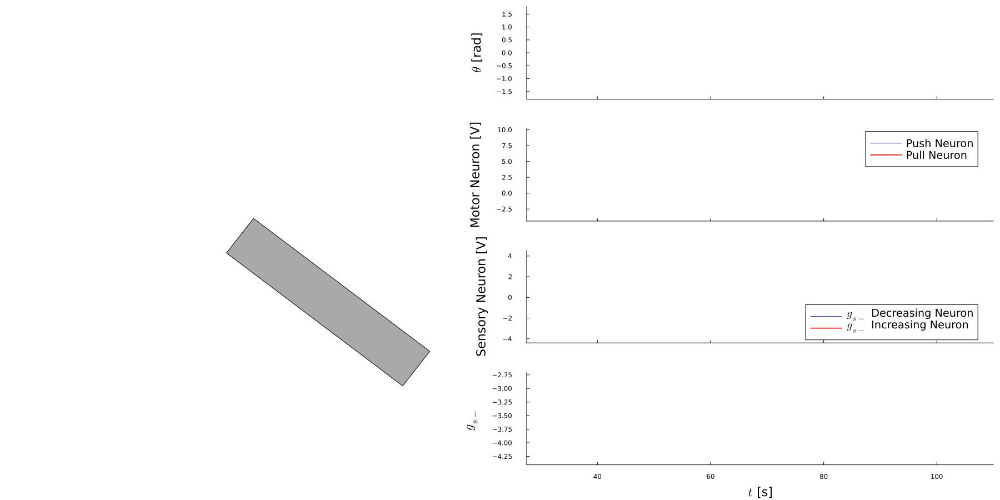

In [112]:
gr(legendfontsize=13,labelfontsize=15)
time = df_angle_mod[!, "time"]
angle = df_angle_mod[!, "1"]
voltage1 = df_voltage_mod[!, "1"]
voltage2 = df_voltage_mod[!, "2"]
voltage_cont1 = df_voltage_mod[!, "3"]
voltage_cont2 = df_voltage_mod[!, "4"]
amp = df_amp_mod[!, "1"]
gsm = df_gsm_mod[!, "1"]

first_ind = size(time)[1]÷4
last_ind = size(time)[1]
t_start = time[first_ind]
t_final = time[last_ind]

max_angle = max(maximum(angle), maximum(amp))
min_angle = min(minimum(angle), minimum(-amp))

max_gsm = maximum(gsm)
min_gsm = minimum(gsm)

max_voltage = max(maximum(voltage1), maximum(voltage2))
min_voltage = -4

max_voltage_cont = max(maximum(voltage_cont1), maximum(voltage_cont2))
min_voltage_cont = -4

length = 10
radius = 1

anim = @animate for i = first_ind:100:last_ind
    l = @layout [
        a{0.5w} Plots.grid(4,1)
    ]
    curr_angle = angle[i]
    s_a = sin(curr_angle)
    c_a = cos(curr_angle)
    radius_cos = radius*c_a
    radius_sin = radius*s_a
    length_cos = length*c_a
    length_sin = length*s_a 

    pendulum = Shape([radius_cos, length_sin + radius_cos, length_sin - radius_cos, -radius_cos, radius_cos], [radius_sin, -length_cos + radius_sin, -length_cos - radius_sin, -radius_sin, radius_sin])
    p1 = plot(pendulum, c=:darkgray, xlims=(-1.05*length,1.05*length) ,ylims=(-1.05*length,1.05*length), legend=false, axis=([], false), grid=false)

    p2 = plot(time[first_ind:i], angle[first_ind:i], grid=false, lw=0.5, lc=:blue, xformatter=Returns(""),
              xlims=(t_start,t_final) ,ylims=(1.1*min_angle, max_angle*1.1), ylabel=latexstring("\$\\theta\$ [rad]"), legend=false)
    plot!(time[first_ind:i], amp[first_ind:i], lc=:black, linestyle=:dash)
    plot!(time[first_ind:i], -amp[first_ind:i], lc=:black, linestyle=:dash)

    p3 = plot(time[first_ind:i], voltage1[first_ind:i], grid=false, lw=0.5, lc=:blue, xformatter=Returns(""),
              xlims=(t_start,t_final) ,ylims=(1.1*min_voltage, max_voltage*1.1), ylabel="Motor Neuron [V]", label="Push Neuron")
    plot!(time[first_ind:i], voltage2[first_ind:i], lc=:red, label="Pull Neuron")

    p4 = plot(time[first_ind:i], voltage_cont1[first_ind:i], grid=false, lw=0.5, lc=:blue, xformatter=Returns(""), legend=:bottomright,
              xlims=(t_start,t_final) ,ylims=(1.1*min_voltage_cont, max_voltage_cont*1.1), ylabel="Sensory Neuron [V]", label=latexstring("\$g_{s-}\$ Decreasing Neuron"))
    plot!(time[first_ind:i], voltage_cont2[first_ind:i], lc=:red, label=latexstring("\$g_{s-}\$ Increasing Neuron"))

    p5 = plot(time[first_ind:i], gsm[first_ind:i], grid=false, lw=0.5, lc=:blue,
              xlims=(t_start,t_final) ,ylims=(1.1*min_gsm, max_gsm*0.9), ylabel=L"g_{s-}", xlabel=latexstring("\$t\$ [s]"), legend=false)
    
    plot(p1, p2, p3, p4, p5, size=(1800,900), bottommargin=20px, layout=l)
end

gif(anim, "mod_neuron.gif", fps = 50)

# Network

In [113]:
df_angle1_net = CSV.read("angle1_hco_mod.csv", DataFrame);
df_angle2_net = CSV.read("angle2_hco_mod.csv", DataFrame);
df_voltage1_net = CSV.read("voltage1_hco_mod.csv", DataFrame);
df_voltage2_net = CSV.read("voltage2_hco_mod.csv", DataFrame);
df_gsm1_net = CSV.read("gsm1_hco_mod.csv", DataFrame);
df_gsm2_net = CSV.read("gsm2_hco_mod.csv", DataFrame);

In [115]:
gr(legendfontsize=13,labelfontsize=15)
time = df_angle1_net[!, "time"]
angle1 = df_angle1_net[!, "1"]
angle2 = df_angle2_net[!, "1"]
voltage1_1 = df_voltage1_net[!, "1"]
voltage2_1 = df_voltage1_net[!, "2"]
voltage1_2 = df_voltage2_net[!, "1"]
voltage2_2 = df_voltage2_net[!, "2"]
gsm1 = df_gsm1_net[!, "1"]
gsm2 = df_gsm2_net[!, "1"]

first_ind = 1
last_ind = size(time)[1]
t_start = time[first_ind]
t_final = time[last_ind]

max_angle = max(maximum(angle1), maximum(angle2))
min_angle = min(minimum(angle1), minimum(angle2))

max_gsm = max(maximum(gsm1), maximum(gsm2))
min_gsm = min(minimum(gsm1), minimum(gsm2))

max_voltage = max(maximum(voltage1_1), maximum(voltage2_1), maximum(voltage1_2), maximum(voltage2_2))
min_voltage = -4

length = 10
radius = 1

anim = @animate for i = first_ind:150:last_ind
    l = @layout [
        a{0.5w} Plots.grid(3,1)
    ]
    curr_angle = angle1[i]
    s_a = sin(curr_angle)
    c_a = cos(curr_angle)
    radius_cos = radius*c_a
    radius_sin = radius*s_a
    length_cos = length*c_a
    length_sin = length*s_a 

    pendulum = Shape([radius_cos, length_sin + radius_cos, length_sin - radius_cos, -radius_cos, radius_cos], [radius_sin, -length_cos + radius_sin, -length_cos - radius_sin, -radius_sin, radius_sin])
    p1 = plot(pendulum, c=:blue, xlims=(-1.05*length,1.05*length) ,ylims=(-1.05*length,1.05*length), label="Pendulum 1", axis=([], false), grid=false, legend=:topright)

    curr_angle = angle2[i]
    s_a = sin(curr_angle)
    c_a = cos(curr_angle)
    radius_cos = radius*c_a
    radius_sin = radius*s_a
    length_cos = length*c_a
    length_sin = length*s_a 

    pendulum = Shape([radius_cos, length_sin + radius_cos, length_sin - radius_cos, -radius_cos, radius_cos], [radius_sin, -length_cos + radius_sin, -length_cos - radius_sin, -radius_sin, radius_sin])
    plot!(pendulum, c=:red, label="Pendulum 2")

    p2 = plot(time[first_ind:i], angle1[first_ind:i], grid=false, lw=0.5, lc=:blue, xformatter=Returns(""),
              xlims=(t_start,t_final) ,ylims=(1.1*min_angle, max_angle*1.1), ylabel=latexstring("\$\\theta\$ [rad]"), legend=false)#, label="Pendulum 1")
    plot!(time[first_ind:i], angle2[first_ind:i], lc=:red)#, label="Pendulum 2")


    p3 = plot(time[first_ind:i], voltage1_1[first_ind:i], grid=false, lw=0.5, lc=:blue, xformatter=Returns(""),
              xlims=(t_start,t_final) ,ylims=(1.1*min_voltage, max_voltage*1.1), ylabel="Push Neuron [V]", legend=false)#, label="Pendulum 1")
    plot!(time[first_ind:i], voltage2_1[first_ind:i], lc=:red)#, label="Pendulum 2")

    p4 = plot(time[first_ind:i], gsm1[first_ind:i], grid=false, lw=0.5, lc=:blue,
              xlims=(t_start,t_final) , ylims=(-3.6, -3.2), ylabel=L"g_{s-}", xlabel=latexstring("\$t\$ [s]"), legend=false)#, label="Pendulum 1")
    plot!(time[first_ind:i], gsm2[first_ind:i], grid=false, lw=0.5, lc=:red)#, label="Pendulum 2")
    
    plot(p1, p2, p3, p4, size=(1800,900), bottommargin=20px, layout=l)
end

gif(anim, "network_neuron.gif", fps = 50)

# Heatmaps

In [76]:
m_arr= [CSV.read("neuron_Iappm2_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappm18_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappm16_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappm14_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappm12_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappm1_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappm08_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappm06_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappm04_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappm02_b_freq.csv", DataFrame),
        CSV.read("neuron_Iapp0_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappp02_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappp04_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappp06_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappp08_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappp1_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappp12_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappp14_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappp16_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappp18_b_freq.csv", DataFrame),
        CSV.read("neuron_Iappp2_b_freq.csv", DataFrame)]

21-element Vector{DataFrame}:
 5751×3 DataFrame
  Row │ gsm      gup      value   
      │ Float64  Float64  Float64 
──────┼───────────────────────────
    1 │    -7.0      1.0      NaN
    2 │    -6.9      1.0      NaN
    3 │    -6.8      1.0      NaN
    4 │    -6.7      1.0      NaN
    5 │    -6.6      1.0      NaN
    6 │    -6.5      1.0      NaN
    7 │    -6.4      1.0      NaN
    8 │    -6.3      1.0      NaN
    9 │    -6.2      1.0      NaN
   10 │    -6.1      1.0      NaN
   11 │    -6.0      1.0      NaN
  ⋮   │    ⋮        ⋮        ⋮
 5742 │    -0.9      9.0      NaN
 5743 │    -0.8      9.0      NaN
 5744 │    -0.7      9.0      NaN
 5745 │    -0.6      9.0      NaN
 5746 │    -0.5      9.0      NaN
 5747 │    -0.4      9.0      NaN
 5748 │    -0.3      9.0      NaN
 5749 │    -0.2      9.0      NaN
 5750 │    -0.1      9.0      NaN
 5751 │     0.0      9.0      NaN
                 5730 rows omitted
 5751×3 DataFrame
  Row │ gsm      gup      value   
      │ Float6

[ Info: Saved animation to c:\Users\chris\OneDrive\Documents\Unif\2022-2023\TFE\ATFE0014_TFE\Presentation\Animations\neuron_freq.gif


Plots.AnimatedGif("c:\\Users\\chris\\OneDrive\\Documents\\Unif\\2022-2023\\TFE\\ATFE0014_TFE\\Presentation\\Animations\\neuron_freq.gif")
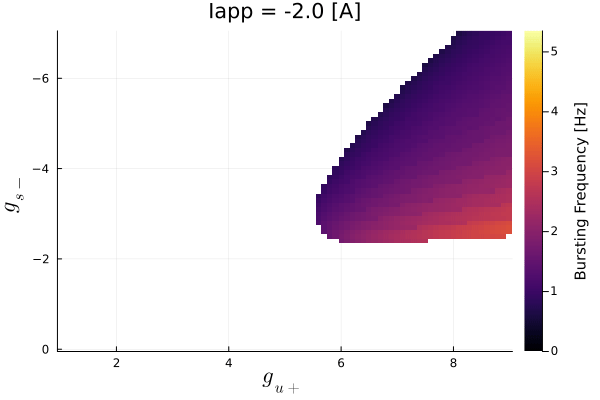

In [101]:
max_v = 0;
min_v = 0;
for i = 1:21
    m = m_arr[i]
    v = reshape(m[!, "value"], (71, 81))
    max_v = max(max_v, maximum(x for x in v if !isnan(x)))
    min_v = min(min_v, minimum(x for x in v if !isnan(x)))
end

anim = @animate for i = 1:21
    m = m_arr[i]
    ind = i - 11
    gsm = ind/5
    x = unique(m[!, "gsm"])
    y = unique(m[!, "gup"])
    v = reshape(m[!, "value"], (71, 81))

    heatmap(y, x, v, ylabel=L"g_{s-}", xlabel=L"g_{u+}", colorbar_title="Bursting Frequency [Hz]", clim=(min_v, max_v), title=format("Iapp = {:.1f} [A]", gsm))
    yflip!()

    ind += 1
end

gif(anim, "neuron_freq.gif", fps = 2)

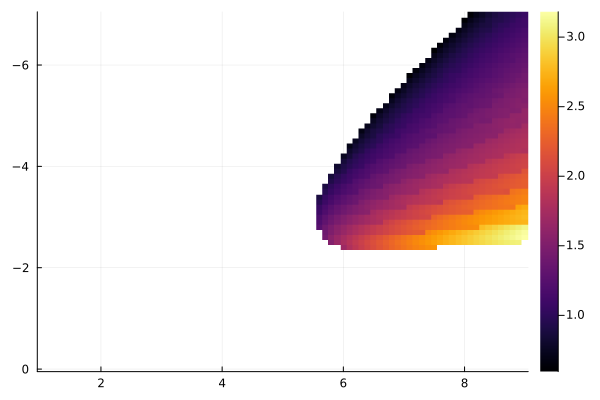

In [61]:
x = unique(df_map_m2[!, "gsm"])
y = unique(df_map_m2[!, "gup"])
v = reshape(df_map_m2[!, "value"], (71, 81))
heatmap(y, x, v)
yflip!()

In [74]:
ind = -10
for i = m_arr
    print(ind/5)
    print(" ")
    ind += 1
end

-2.0 -1.8 -1.6 -1.4 -1.2 -1.0 -0.8 -0.6 -0.4 -0.2 0.0 0.2 0.4 0.6 0.8 1.0 1.2 1.4 1.6 1.8 2.0 

In [82]:
max_v

NaN